In [2]:
from connectivity.tasks import get_betas, plot_task_maps_cerebellum
import SUITPy as suit
import numpy as np
import connectivity.data as data

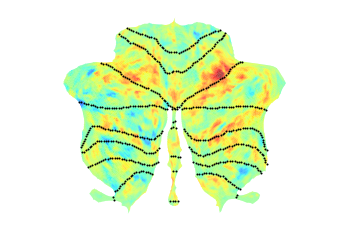

<AxesSubplot:>

In [34]:
# Test to plot a single wbeta 
Ydata = data.Dataset(experiment="sc2", glm="glm7", roi="cerebellum_suit", subj_id="s04")
Ydata.load_mat()  # Import the data from Matlab


nii_func = data.convert_cerebellum_to_nifti(Ydata.data[1,:])
# Map to surface
map_func = suit.flatmap.vol_to_surf(nii_func)
# Plot the flatmap
suit.flatmap.plot(map_func,cscale=[-0.5,0.5])


In [15]:
np.min(map_func)

-0.3864310284955252

In [8]:
Ydata = data.Dataset(experiment="sc2", glm="glm7", roi="cerebellum_suit", subj_id="s02")
Ydata.load_mat()  # Import the data from Matlab
Ydata.data.shape

(784, 6937)

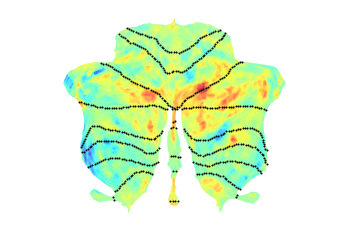

<AxesSubplot:>

In [36]:
Ydata = data.Dataset(experiment="sc2", glm="glm7", roi="cerebellum_suit", subj_id="s03")
Ydata.load_mat()  # Import the data from Matlab
Y, Y_info = Ydata.get_data(averaging="exp",weighting = False)

# plot task betas: This is Maedbh's versopn: 
# view = plot_task_maps_cerebellum(data=Y, data_info=Y_info, task='Instruct')
# view
Yavr =  np.mean(Y[Y_info.cond==29,:],axis=0)
Yavr = Yavr - np.mean(Y[Y_info.inst==0,:],axis=0)
nii_func = data.convert_cerebellum_to_nifti(Yavr)
# Map to surface
map_func = suit.flatmap.vol_to_surf(nii_func)
# Plot the flatmap
suit.flatmap.plot(map_func,cscale=[-0.2,0.2])


In [3]:
Y, Y_info = get_betas(roi='cerebellum_suit', 
                    glm='glm7', 
                    exp='sc2',
                    averaging="exp", 
                    weighting=False)
# Averaging across subjects 
Y = np.mean(Y,axis=0)
# Averaging across betas 
Yavr =  np.mean(Y[Y_info.cond==12,:],axis=0)
Yavr = Yavr - np.mean(Y[Y_info.inst==0,:],axis=0)
nii_func = data.convert_cerebellum_to_nifti(Yavr)
# Map to surface
map_func = suit.flatmap.vol_to_surf(nii_func)
# Plot the flatmap
suit.flatmap.plot(map_func)


IndexError: boolean index did not match indexed array along dimension 0; dimension is 24 but corresponding boolean dimension is 49

In [5]:
Y.shape

(24, 49, 6937)